In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import json
import os
import sqlite3
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from IPython.display import HTML
from itertools import combinations
from clustering import prep_data_for_clustering, get_kdist, \
    display_pca_views, kmeans_proper, cluster_range, \
    plot_clusters2, plot_internal, heirarch_cluster, \
    print_cluster_metrics, kmed_proper

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS, cluster_optics_dbscan
from sklearn.metrics import silhouette_score

<img src="images/title.png" width=800>

## Abstract

blah blah blah

inedit ko to - merv

## Introduction

### London Fire Brigade

something about LFB and blah blah blah

### Problem Statement

This analysis aims to uncover response time patterns in fire incidents with the goal of developing targeted strategies per incident type especially those that need improvement in terms of response time.

## Methodology

<img src="images/methodology.png" width=800>

**brief desc of each step here

## Data Source

The London Fire Brigade's (LFB) incident data from January 2020 to August 2023 was chosen as the dataset for this analysis since the nature of this study is to improve the system's current response time and develop targeted strategies. With this, it is essential to know the status of LFB's current system and improve on this further. The dataset wIll be placed in a sqlite database for easier data manipulation and exploration.

In [3]:
# directory = '/mnt/data/public/lfb/'
# files = os.listdir(directory)
# lfb_data = files[7]  # lfb incident data from 202001 to 202308

# if not os.path.exists('lfb.db'):
#     print("SQLite DB does not exist. Loading csv dataset to the db again...")
#     df = pd.read_excel(os.path.join(directory, lfb_data))
#     display(df.head())
#     conn = sqlite3.connect('lfb.db')
#     df.to_sql('incidents_202001_202308', conn,
#               if_exists='replace', index_label=None)
#     conn.commit()
#     print("Dataset loaded to SQLite DB.")
# else:
print("SQLite DB already exists.")
conn = sqlite3.connect('lfb.db')
print("Connection established with SQLite DB.")

SQLite DB already exists.
Connection established with SQLite DB.


In [4]:
query = "SELECT * FROM incidents_202001_202308"
display_df = pd.read_sql(query, conn)
display_df = display_df.head()
display_df.style.set_table_attributes(
    "style='display:inline'").set_caption(
    'Table 1. London Fire Brigade Incident Data from January 2020\
    to August 2023').set_table_styles(
    [dict(selector = "caption", 
               props = [("text-align", "left")])])

,index,IncidentNumber,DateOfCall,CalYear,TimeOfCall,HourOfCall,IncidentGroup,StopCodeDescription,SpecialServiceType,PropertyCategory,PropertyType,AddressQualifier,Postcode_full,Postcode_district,UPRN,USRN,IncGeo_BoroughCode,IncGeo_BoroughName,ProperCase,IncGeo_WardCode,IncGeo_WardName,IncGeo_WardNameNew,Easting_m,Northing_m,Easting_rounded,Northing_rounded,Latitude,Longitude,FRS,IncidentStationGround,FirstPumpArriving_AttendanceTime,FirstPumpArriving_DeployedFromStation,SecondPumpArriving_AttendanceTime,SecondPumpArriving_DeployedFromStation,NumStationsWithPumpsAttending,NumPumpsAttending,PumpCount,PumpHoursRoundUp,Notional Cost (£),NumCalls
0,0,000001-01012020,2020-01-01T00:00:00,2020,00:02:11.000000,0,Special Service,Special Service,Lift Release,Dwelling,Purpose Built Flats/Maisonettes - 4 to 9 storeys,Within same building,None,SE1,0,21901000,E09000022,LAMBETH,Lambeth,E05014118,Waterloo & South Bank,Waterloo & South Bank,nan,nan,531050,179550,nan,nan,London,Lambeth,nan,None,nan,None,1.000000,1.000000,1.000000,1.000000,339.000000,3.000000
1,1,000003-01012020,2020-01-01T00:00:00,2020,00:06:30.000000,0,Fire,Primary Fire,None,Non Residential,Private Garden Shed,On land associated with building,None,UB8,0,21402055,E09000017,HILLINGDON,Hillingdon,E05013566,Colham & Cowley,Colham & Cowley,nan,nan,506750,181550,nan,nan,London,Hillingdon,324.000000,Hillingdon,292.000000,Hillingdon,1.000000,2.000000,2.000000,1.000000,339.000000,3.000000
2,2,000004-01012020,2020-01-01T00:00:00,2020,00:07:07.000000,0,Special Service,Special Service,Lift Release,Dwelling,Purpose Built Flats/Maisonettes - 4 to 9 storeys,Within same building,None,N6,0,21106425,E09000014,HARINGEY,Haringey,E05013592,Highgate,Highgate,nan,nan,528250,187850,nan,nan,London,Hornsey,nan,None,nan,None,1.000000,1.000000,1.000000,1.000000,339.000000,1.000000
3,3,000008-01012020,2020-01-01T00:00:00,2020,00:11:05.000000,0,False Alarm,AFA,None,Non Residential,Telephone exchange,Correct incident location,TW9 1LW,TW9,10002252088,22403714,E09000027,RICHMOND UPON THAMES,Richmond Upon thames,E05013786,South Richmond,South Richmond,518296.000000,174887.000000,518250,174850,51.460614,-0.298579,London,Richmond,195.000000,Richmond,nan,None,1.000000,1.000000,1.000000,1.000000,339.000000,1.000000
4,4,000009-01012020,2020-01-01T00:00:00,2020,00:11:16.000000,0,Fire,Secondary Fire,None,Outdoor Structure,Small refuse/rubbish container,On land associated with building,N9 8NB,N9,207090844,20703225,E09000010,ENFIELD,Enfield,E05013685,Lower Edmonton,Lower Edmonton,535304.000000,194202.000000,535350,194250,51.630370,-0.046492,London,Edmonton,426.000000,Edmonton,nan,None,1.000000,1.000000,1.000000,1.000000,339.000000,1.000000


The DataFrame above shows a snippet of the main dataset. Only specific columns that are essential in coming up with a coherent analysis will be used from this dataset. These said columns will be discussed in the next portion of this paper. For now, the table below shows a brief description of what each column in the main dataset means.

<center>Table 2. Dataset Column Descriptions</center>

| Column                             | Sample record      | Description                                            |
|:-----------------------------------|:-------------------|:-------------------------------------------------------|
| IncidentNumber                     | 000008-01012018    | LFB Incident Number                                    |
| DateOfCall                         | 01-Jan-18          | Date of 999 call                                       |
| CalYear                            | 2018               | Year of 999 call                                       |
| TimeOfCall                         | 0:04:25            | Time of 999 call                                       |
| HourOfCall                         | 0                  | Hour of 999 call                                       |
| IncidentGroup                      | False Alarm, Fire, Special | High level incident category                |
| PropertyCategory                   | Non Residential    | High level property descriptor                         |
| PropertyType                       | Mosque             | Detailed property descriptor                           |
| IncGeo_BoroughName                 | BARNET             | Borough Name                                           |
| IncidentStationGround              | Finchley           | LFB Station ground                                     |
| FirstPumpArriving_AttendanceTime   | 348                | First Pump attendance time in seconds                  |
| FirstPumpArriving_DeployedFromStation | Finchley        | First Pump deployed from station                       |
| SecondPumpArriving_AttendanceTime  |                    | Second Pump attendance time in seconds                 |
| SecondPumpArriving_DeployedFromStation |                | Second Pump deployed from station                      |
| NumStationsWithPumpsAttending      | 1                  | Inital Number of stations with pumps in attendance            |
| NumPumpsAttending                  | 1                  | Initial Number of pumps in attendance                          |
| PumpCount                          | 1                  | Total number of pumps at fires conclusion                                                       |
| PumpHoursRoundUp                 | 1                  | Time spent at incident by pumps |
| Notional Cost (£)                  | 328                | Time spent multiplied by notional annual cost of a pump |
| NumCalls                           | 1                  | Number of calls received about the incident            |

Notes: `pump` is slang for a firetruck

## Exploratory Data Analysis

Initial exploratory data analysis (EDA) was done to set the scope and limitations of the analysis and create a clearer picture of what the dataset looks like. Necessary decisions regarding the different parameters of the analysis were made based on findings from this EDA.

### Scope and Limitations

In [5]:
query = """
SELECT DISTINCT
    incidentnumber,
    COUNT(1) row_cnt
FROM incidents_202001_202308
GROUP BY 1 
ORDER BY 2 DESC
"""

display_df = pd.read_sql(query, conn)
display_df = display_df.head()
display_df.style.set_table_attributes(
    "style='display:inline'").set_caption('Table 3. Number of Rows per `IncidentNumber`')

,IncidentNumber,row_cnt
0,213957-31122022,1
1,213954-31122022,1
2,213953-31122022,1
3,213951-31122022,1
4,213949-31122022,1


The number of rows per `IncidentNumber` was obtained to make sure that the dataset is distinct by this dataset feature. It can be seen in <i>Table 3</i> that the dataset is indeed distinct by this column. With this, `IncidentNumber` will be used as an index for our analysis dataset.

In [6]:
query = """
SELECT DISTINCT
    calyear,
    MIN(DATE(dateofcall)) min_date,
    MAX(DATE(dateofcall)) max_date,
    COUNT(DISTINCT IncidentNumber) incident_cnt
FROM incidents_202001_202308
GROUP BY calyear
ORDER BY 1
"""

display_df = pd.read_sql(query, conn)
display_df.style.set_table_attributes(
    "style='display:inline'").set_caption('Table 4. Number of Incidents per Calendar Year')

,CalYear,min_date,max_date,incident_cnt
0,2020,2020-01-01,2020-12-31,98568
1,2021,2021-01-01,2021-12-31,109577
2,2022,2022-01-01,2022-12-31,125392
3,2023,2023-01-01,2023-08-31,80712


From <i>Table 4</i> above, it can be seen that the data available for the year 2023 is until August only. This will limit the study to analyze data until August 2023 only. Furthermore, an increasing number of incidents can be seen from 2020 to 2022. 

In [7]:
query = """
SELECT DISTINCT
    IncidentGroup,
    COUNT(DISTINCT IncidentNumber) incident_cnt
FROM incidents_202001_202308
GROUP BY 1
ORDER BY 2 DESC
"""

display_df = pd.read_sql(query, conn)
display_df.style.set_table_attributes(
    "style='display:inline'").set_caption('Table 5. Number of Incidents per `IncidentGroup`')

,IncidentGroup,incident_cnt
0,False Alarm,202768
1,Special Service,148798
2,Fire,62683


The number of incidents per `IncidentGroup` was obtained to see how many datapoints are available for each. It can be observed from <i>Table 5</i> that most of the datapoints are false alarms and only around 62,000 datapoints are for fire incidents. As the goal of this analysis is to uncover patterns of fire incidents and develop strategies for better response time, the dataset to be used for the analysis will be filtered to `IncidentGorup = 'Fire'` to analyze fire incidents alone.

### Dataset features used for clustering

Not all features in the main dataset will be utilized in the clustering proper. Below are the numerical features to be used in clustering:
- FirstPumpArriving_AttendanceTime (first_pump_time)
- SecondPumpArriving_AttendanceTime (second_pump_time)
- NumStationsWithPumpsAttending (num_of_station_pumps)
- NumPumpsAttending (num_pumps)
- PumpCount (pump_cnt)
- PumpHoursRoundUp (pump_hrs_rnd_up)
- Notional Cost (£) (notional_cost)
- NumCalls (num_calls)

These features were chosen since these are the metrics involved in fire response in terms of response time and resources allocated in dealing with a fire incident. All the leftover categorical variables will be used later in the labelling phase to bring out things that are most common inside the clusters that will be discovered.

In [8]:
query = """
SELECT DISTINCT
    IncidentNumber,
    FirstPumpArriving_AttendanceTime,
    SecondPumpArriving_AttendanceTime,
    NumStationsWithPumpsAttending,
    NumPumpsAttending,
    PumpCount,
    PumpHoursRoundUp,
    "Notional Cost (£)",
    NumCalls
FROM incidents_202001_202308
WHERE IncidentGroup = 'Fire'
"""

cluster_df = pd.read_sql(query, conn).set_index('IncidentNumber')
cluster_display_df = cluster_df.head()
cluster_display_df.style.set_table_attributes(
    "style='display:inline'").set_caption('Table 6. Dataset Features for Clustering')

,FirstPumpArriving_AttendanceTime,SecondPumpArriving_AttendanceTime,NumStationsWithPumpsAttending,NumPumpsAttending,PumpCount,PumpHoursRoundUp,Notional Cost (£),NumCalls
IncidentNumber,,,,,,,,
000003-01012020,324.000000,292.000000,1.000000,2.000000,2.000000,1.000000,339.000000,3.000000
000009-01012020,426.000000,nan,1.000000,1.000000,1.000000,1.000000,339.000000,1.000000
000017-01012020,281.000000,508.000000,2.000000,2.000000,2.000000,2.000000,678.000000,2.000000
000023-01012020,289.000000,360.000000,2.000000,2.000000,2.000000,1.000000,339.000000,1.000000
000031-01012020,160.000000,185.000000,1.000000,2.000000,2.000000,2.000000,678.000000,1.000000


Checking the distribution of the data as well as getting the measures of central tendency of each feature will give a clear picture of the dataset.

In [9]:
cluster_display_df = cluster_df.describe()
cluster_display_df.style.set_table_attributes(
    "style='display:inline'").set_caption('Table 7. Measures of Central Tendency of Features for Clustering')

,FirstPumpArriving_AttendanceTime,SecondPumpArriving_AttendanceTime,NumStationsWithPumpsAttending,NumPumpsAttending,PumpCount,PumpHoursRoundUp,Notional Cost (£),NumCalls
count,62057.000000,25982.000000,62606.000000,62606.000000,62595.000000,62579.000000,62579.000000,62683.000000
mean,322.845126,406.008429,1.478245,1.646152,1.924339,2.461257,880.368350,2.193083
std,139.679380,156.707590,0.852962,0.979921,2.680008,10.421671,3716.014641,3.517740
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,339.000000,1.000000
25%,234.000000,305.000000,1.000000,1.000000,1.000000,1.000000,352.000000,1.000000
50%,301.000000,381.000000,1.000000,1.000000,1.000000,1.000000,364.000000,1.000000
75%,383.000000,474.000000,2.000000,2.000000,2.000000,2.000000,704.000000,2.000000
max,1199.000000,1200.000000,14.000000,14.000000,156.000000,680.000000,247520.000000,124.000000


From the table above, there are more non-null for the `FirstPumpArriving_AttendanceTime` compared to the `SecondPumpArriving_AttendanceTime`. This suggests that the latter feature is sparse. Imputing of null values for this feature will be discussed later on. The standard deviation of both said features are close to each other. For `Notional Cost`, this feature has a high standard deviation. This suggests that this feature may have outliers since the maximum value is far from the 75th percentile. The rest of the variables (`NumStationsWithPumpsAttending`, `NumPumpsAttending`, `PumpCount`, `PumpHoursRoundUp`, and `NumCalls`) are discrete in nature and the standard deviation is relatively low.

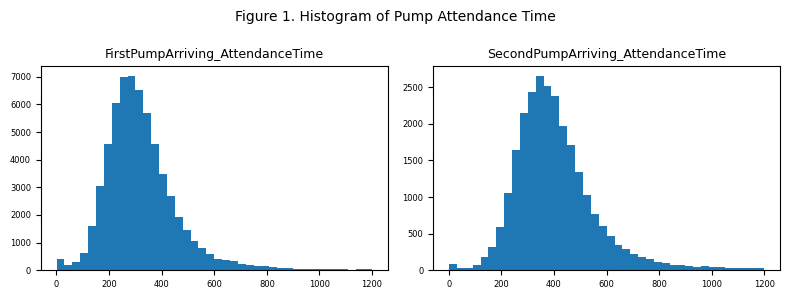

In [10]:
hist_df = cluster_df[['FirstPumpArriving_AttendanceTime', 'SecondPumpArriving_AttendanceTime']]
fig, axes = plt.subplots(1, 2, figsize=(8, 3))
axes = axes.flatten()

for i, ax in zip(hist_df.columns, axes):
    ax.hist(cluster_df[i], bins=40)
    ax.set_title(i, fontsize=9)
    ax.tick_params(axis='y', labelsize=6)
    ax.tick_params(axis='x', labelsize=6)

plt.suptitle('Figure 1. Histogram of Pump Attendance Time', fontsize=10)
plt.tight_layout()
plt.show()

<i>Figure 1</i> shows the histogram of the clustering features pertaining to pump attendance time. Both features exhibit a bell-shaped curve with minimal skewness.

#### Handling Null Values

Previously, it was discussed that null values are present for the `SecondPumpArriving_AttendanceTime` feature. In this section, the methodology for imputing these null values will be discussed.

In [11]:
cluster_df.isnull().sum()

FirstPumpArriving_AttendanceTime       626
SecondPumpArriving_AttendanceTime    36701
NumStationsWithPumpsAttending           77
NumPumpsAttending                       77
PumpCount                               88
PumpHoursRoundUp                       104
Notional Cost (£)                      104
NumCalls                                 0
dtype: int64

The presence of null values for `FirstPumpArriving_AttendanceTime` can be observed above. It was decided to completely remove incidents with null `FirstPumpArriving_AttendanceTime` since this feature is relevant in clustering the dataset as it shows the time it takes for a pump to arrive at the scene of the incident. Since the goal of the analysis is to assess response time, having no data for this feature will affect the classification of the incidents; thus, rows with null `FirstPumpArriving_AttendanceTime` will be removed from the clustering data.

In [12]:
cluster_df = cluster_df[cluster_df['FirstPumpArriving_AttendanceTime'].notna()]
cluster_df.isnull().sum()

FirstPumpArriving_AttendanceTime         0
SecondPumpArriving_AttendanceTime    36075
NumStationsWithPumpsAttending            0
NumPumpsAttending                        0
PumpCount                                0
PumpHoursRoundUp                        16
Notional Cost (£)                       16
NumCalls                                 0
dtype: int64

In [13]:
query = """
SELECT DISTINCT
    NumPumpsAttending,
    SUM(CASE WHEN SecondPumpArriving_AttendanceTime IS NULL THEN 1 ELSE 0 END) null_second_pump_time
FROM incidents_202001_202308
WHERE IncidentGroup = 'Fire'
      AND FirstPumpArriving_AttendanceTime IS NOT NULL
      AND SecondPumpArriving_AttendanceTime IS NULL
GROUP BY 1
"""

pd.read_sql(query, conn)

,NumPumpsAttending,null_second_pump_time
0,1.0,34800
1,2.0,1195
2,3.0,56
3,4.0,19
4,5.0,4
5,7.0,1


Upon removing rows with null `FirstPumpArriving_AttendanceTime`, there are still null values for `SecondPumpArriving_AttendanceTime`. These will be imputed with `0` since having no value for this feature means that only one station attended the incident. In the cases where more than 1 pump attended the incident and only `FirstPumpArriving_AttendanceTime` is not null, this means that all pumps that showed up in the incident come from 1 station only. With all of this in mind, it was decided to impute null values for `SecondPumpArriving_AttendanceTime` with `0`.

Also, it can be observed that null values are also present for `PumpHoursRoundUp` and `Notional Cost (£)`. The first feature refers to the amount of time the pump was used in the incident and the second feature is dependent on this as this is the cost of using the pump. Having non-null values for these features is important as these reflect the efficiency of LFB in responding to the incident. With this, it was decided to remove rows in the dataset where `PumpHoursRoundUp` and `Notional Cost (£)` are null.

In [14]:
cluster_df = cluster_df[cluster_df[['PumpHoursRoundUp', 'Notional Cost (£)']].notna().all(axis=1)]
cluster_df['SecondPumpArriving_AttendanceTime'].fillna(0, inplace=True)
cluster_df.isnull().sum()

FirstPumpArriving_AttendanceTime     0
SecondPumpArriving_AttendanceTime    0
NumStationsWithPumpsAttending        0
NumPumpsAttending                    0
PumpCount                            0
PumpHoursRoundUp                     0
Notional Cost (£)                    0
NumCalls                             0
dtype: int64

In [15]:
cluster_df.head()

,FirstPumpArriving_AttendanceTime,SecondPumpArriving_AttendanceTime,NumStationsWithPumpsAttending,NumPumpsAttending,PumpCount,PumpHoursRoundUp,Notional Cost (£),NumCalls
IncidentNumber,,,,,,,,
000003-01012020,324.0,292.0,1.0,2.0,2.0,1.0,339.0,3.0
000009-01012020,426.0,0.0,1.0,1.0,1.0,1.0,339.0,1.0
000017-01012020,281.0,508.0,2.0,2.0,2.0,2.0,678.0,2.0
000023-01012020,289.0,360.0,2.0,2.0,2.0,1.0,339.0,1.0
000031-01012020,160.0,185.0,1.0,2.0,2.0,2.0,678.0,1.0


#### Outlier Removal

In [16]:
cluster_df.describe()

,FirstPumpArriving_AttendanceTime,SecondPumpArriving_AttendanceTime,NumStationsWithPumpsAttending,NumPumpsAttending,PumpCount,PumpHoursRoundUp,Notional Cost (£),NumCalls
count,62041.000000,62041.000000,62041.000000,62041.000000,62041.000000,62041.000000,62041.000000,62041.000000
mean,322.813285,170.014587,1.481504,1.650296,1.928289,2.460808,880.193098,2.179994
std,139.616575,224.509324,0.855191,0.982182,2.684615,10.442433,3723.103279,3.447004
min,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,339.000000,1.000000
25%,234.000000,0.000000,1.000000,1.000000,1.000000,1.000000,352.000000,1.000000
50%,301.000000,0.000000,1.000000,1.000000,1.000000,1.000000,364.000000,1.000000
75%,383.000000,352.000000,2.000000,2.000000,2.000000,2.000000,704.000000,2.000000
max,1199.000000,1200.000000,14.000000,14.000000,156.000000,680.000000,247520.000000,124.000000


In [17]:
cluster_df.shape

(62041, 8)

In [18]:
cluster_df_stats = cluster_df.describe()
cluster_df_stats['PumpHoursRoundUp'].loc['75%']

2.0

In [19]:
len(cluster_df[cluster_df['PumpHoursRoundUp'] > 2.0])

9530

In [20]:
Q1 = cluster_df['PumpHoursRoundUp'].quantile(0.25)
Q3 = cluster_df['PumpHoursRoundUp'].quantile(0.75)
IQR = Q3 - Q1

# Define upper and lower bounds to identify outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# # Remove outliers
# cluster_df = cluster_df[(cluster_df['PumpHoursRoundUp'] >= lower_bound)
#                         & (cluster_df['PumpHoursRoundUp'] <= upper_bound)]
new_cluster_df = cluster_df[cluster_df['PumpHoursRoundUp'] <= upper_bound]
new_cluster_df.shape

(55947, 8)

In [21]:
np.median(cluster_df['PumpHoursRoundUp'])

1.0

In [22]:
cluster_df['PumpHoursRoundUp'].value_counts().sort_values(ascending=False)

PumpHoursRoundUp
1.0      43144
2.0       9367
3.0       3436
4.0       1629
5.0        884
         ...  
393.0        1
641.0        1
63.0         1
182.0        1
112.0        1
Name: count, Length: 161, dtype: int64

In [23]:
cluster_df['PumpHoursRoundUp'].astype(float).describe()

count    62041.000000
mean         2.460808
std         10.442433
min          1.000000
25%          1.000000
50%          1.000000
75%          2.000000
max        680.000000
Name: PumpHoursRoundUp, dtype: float64

#### Filtering Out Illogical Scenarios

In [24]:
query = """
SELECT
        IncidentNumber,
        IncidentGroup,
        CalYear CallYear,
        CAST(SUBSTR(DateOfCall, 6, 2) AS INTEGER) CallMonth,
        CAST(SUBSTR(DateOfCall, 9, 2) AS INTEGER) AS CallDay,
        HourOfCall HourOfCall,
        strftime('%Y-%m-%d', DateOfCall) DateOfCall,
        strftime('%H:%M:%S', TimeOfCall) TimeOfCall,
        IncGeo_BoroughName as borough,
        IncGeo_WardName as ward,
        IncidentStationGround,
        FirstPumpArriving_DeployedFromStation,
        SecondPumpArriving_DeployedFromStation,
        PropertyCategory,
        PropertyType,
        FirstPumpArriving_AttendanceTime as first_pump_time,
        SecondPumpArriving_AttendanceTime as second_pump_time,
        NumStationsWithPumpsAttending as num_of_station_pumps,
        NumPumpsAttending as num_pumps,
        PumpCount as pump_cnt,
        PumpHoursRoundUp as pump_hrs_rnd_up,
        "Notional Cost (£)" as notional_cost,
        NumCalls as num_calls,
        Latitude as lat,
        Longitude as long
FROM incidents_202001_202308
WHERE IncidentGroup = 'Fire'
      AND FirstPumpArriving_AttendanceTime IS NOT NULL
      AND PumpHoursRoundUp IS NOT NULL
      AND "Notional Cost (£)" IS NOT NULL
      AND PumpCount >= NumPumpsAttending
"""

trimmed_df = pd.read_sql(query, conn)
trimmed_df.head()

,IncidentNumber,IncidentGroup,CallYear,CallMonth,CallDay,HourOfCall,DateOfCall,TimeOfCall,borough,ward,...,first_pump_time,second_pump_time,num_of_station_pumps,num_pumps,pump_cnt,pump_hrs_rnd_up,notional_cost,num_calls,lat,long
0,000003-01012020,Fire,2020,1,1,0,2020-01-01,00:06:30,HILLINGDON,Colham & Cowley,...,324.0,292.0,1.0,2.0,2.0,1.0,339.0,3.0,NaN,NaN
1,000009-01012020,Fire,2020,1,1,0,2020-01-01,00:11:16,ENFIELD,Lower Edmonton,...,426.0,NaN,1.0,1.0,1.0,1.0,339.0,1.0,51.630370,-0.046492
2,000017-01012020,Fire,2020,1,1,0,2020-01-01,00:15:59,WALTHAM FOREST,Leyton,...,281.0,508.0,2.0,2.0,2.0,2.0,678.0,2.0,51.565011,-0.018229
3,000023-01012020,Fire,2020,1,1,0,2020-01-01,00:18:25,WESTMINSTER,Queen's Park,...,289.0,360.0,2.0,2.0,2.0,1.0,339.0,1.0,NaN,NaN
4,000031-01012020,Fire,2020,1,1,0,2020-01-01,00:23:09,WALTHAM FOREST,Hoe Street,...,160.0,185.0,1.0,2.0,2.0,2.0,678.0,1.0,51.589453,-0.017082


In [25]:
trimmed_df['second_pump_time'] = trimmed_df['second_pump_time'].fillna(0)

In [26]:
trimmed_df.head(1)

,IncidentNumber,IncidentGroup,CallYear,CallMonth,CallDay,HourOfCall,DateOfCall,TimeOfCall,borough,ward,...,first_pump_time,second_pump_time,num_of_station_pumps,num_pumps,pump_cnt,pump_hrs_rnd_up,notional_cost,num_calls,lat,long
0,000003-01012020,Fire,2020,1,1,0,2020-01-01,00:06:30,HILLINGDON,Colham & Cowley,...,324.0,292.0,1.0,2.0,2.0,1.0,339.0,3.0,NaN,NaN


In [27]:
# pd.set_option('display.max_columns', None)
# trimmed_df[trimmed_df['pump_cnt'] > 50][['DateOfCall', 'borough', 'num_of_station_pumps', 'num_pumps',	'pump_cnt']]

In [28]:
# Q1 = trimmed_df['pump_hrs_rnd_up'].quantile(0.25)
# Q3 = trimmed_df['pump_hrs_rnd_up'].quantile(0.75)
# IQR = Q3 - Q1

# # Define upper and lower bounds to identify outliers
# lower_bound = Q1 - 1.5 * IQR
# upper_bound = Q3 + 1.5 * IQR

# # trimmed_df = trimmed_df[(trimmed_df['pump_hrs_rnd_up'] >= lower_bound)
# #                         & (trimmed_df['pump_hrs_rnd_up'] <= upper_bound)]
# trimmed_df = trimmed_df[trimmed_df['pump_hrs_rnd_up'] <= upper_bound]
# trimmed_df.shape

In [29]:
trimmed_df.describe()

,CallYear,CallMonth,CallDay,HourOfCall,first_pump_time,second_pump_time,num_of_station_pumps,num_pumps,pump_cnt,pump_hrs_rnd_up,notional_cost,num_calls,lat,long
count,61917.000000,61917.000000,61917.000000,61917.000000,61917.000000,61917.000000,61917.000000,61917.000000,61917.000000,61917.000000,61917.000000,61917.000000,42795.000000,42795.000000
mean,2021.384030,6.163477,15.706123,14.039747,322.731269,170.235412,1.480240,1.649208,1.929761,2.463330,881.095030,2.181162,51.440585,-0.105707
std,1.070671,3.065196,8.838160,6.308699,139.565046,224.525337,0.855254,0.982524,2.686976,10.452707,3726.766009,3.449025,1.880012,0.165599
min,2020.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,339.000000,1.000000,0.000000,-0.510069
25%,2020.000000,4.000000,8.000000,10.000000,234.000000,0.000000,1.000000,1.000000,1.000000,1.000000,352.000000,1.000000,51.463351,-0.208654
50%,2021.000000,6.000000,16.000000,15.000000,301.000000,0.000000,1.000000,1.000000,1.000000,1.000000,364.000000,1.000000,51.515002,-0.096519
75%,2022.000000,8.000000,23.000000,19.000000,383.000000,352.000000,2.000000,2.000000,2.000000,2.000000,704.000000,2.000000,51.558514,0.006364
max,2023.000000,12.000000,31.000000,23.000000,1199.000000,1200.000000,14.000000,14.000000,156.000000,680.000000,247520.000000,124.000000,51.690015,0.309261


Recorded incidents in the dataset where `PumpCount` is less than `NumPumpsAttending` will be removed from the clustering dataset since it is assumed that one `NumPumpsAttending` is to one `PumpCount`. With this, having a lesser value for `PumpCount` does not seem reasonable.

On the other hand, cases where `NumPumpsAttending` is greater than `PumpCount` are retained since the assumption stated earlier is satisfied; however, this may reflect inefficiencies in the current process of LFB since this scenario indicates that some fire trucks were not utilized during the incident.

## Analysis

### Prepare and Split Dataset for Exploration and Final Analysis 

Data preparation methodology:
- Prepare query getting important columns from `incidents_202001_202308` table in `lfb.db`
- Filter where `IncidentGroup = 'Fire'`
- Optional: Add additional filter query if present
- Get all numeric columns and apply StandardScaler
- Optional: save `df_prep` as local file
- Return tuples `df_prep` and `df_orig`
    - `df_prep` - for dimenionality reduction and clustering
    - `df_orig` - to label after clustering and labelling

Using helper function <u>prep_data_for_clustering</u> from <u>clustering.py</u> to prepare and split data for explore and final

- `final_df` - all dates (2020-2023)
- `explore_df` - Jan, Feb, March 2023 only

In [30]:
def prep_data_for_clustering2(input_df, explore):
    if explore:
        filtered_df = input_df[
            (input_df['CallYear'] == 2023) & 
            (input_df['CallMonth'].isin([1, 2, 3]))
        ]
        numeric_cols = filtered_df.select_dtypes(include='number')
        numeric_cols.drop(
            columns=['CallYear', 'CallMonth', 'CallDay', 'HourOfCall', 'lat', 'long'],
            inplace=True,
        )
        standard_scaler = StandardScaler()
        numeric_cols_scaled = standard_scaler.fit_transform(numeric_cols.to_numpy())
        df_prep = pd.DataFrame(numeric_cols_scaled, index=numeric_cols.index, columns=list(numeric_cols.columns))
        return df_prep, filtered_df
    else:
        numeric_cols = input_df.select_dtypes(include='number')
        numeric_cols.drop(
            columns=['CallYear', 'CallMonth', 'CallDay', 'HourOfCall', 'lat', 'long'],
            inplace=True,
        )
        standard_scaler = StandardScaler()
        numeric_cols_scaled = standard_scaler.fit_transform(numeric_cols.to_numpy())
        df_prep = pd.DataFrame(numeric_cols_scaled, index=numeric_cols.index, columns=list(numeric_cols.columns))
        return df_prep, input_df

In [31]:
final_df = prep_data_for_clustering2(trimmed_df, False)
explore_df = prep_data_for_clustering2(trimmed_df, True)

In [32]:
explore_df[0]

,first_pump_time,second_pump_time,num_of_station_pumps,num_pumps,pump_cnt,pump_hrs_rnd_up,notional_cost,num_calls
50934,0.458086,1.379425,1.596853,2.141268,1.122319,0.152002,0.152002,0.709400
50935,-0.179980,-0.842536,-0.602007,-0.716926,-0.551332,-0.290304,-0.290304,0.000208
50936,-1.079422,1.126235,0.497423,0.235805,0.006552,-0.069151,-0.069151,-0.354388
50937,1.134589,-0.842536,-0.602007,-0.716926,-0.551332,-0.290304,-0.290304,-0.354388
50938,-0.318356,-0.301233,-0.602007,0.235805,0.006552,-0.290304,-0.290304,3.191572
...,...,...,...,...,...,...,...,...
54335,-0.118480,-0.842536,-0.602007,-0.716926,-0.551332,-0.290304,-0.290304,-0.354388
54336,-0.425981,0.746450,0.497423,0.235805,0.006552,-0.290304,-0.290304,-0.354388
54337,1.565091,-0.842536,-0.602007,-0.716926,-0.551332,-0.290304,-0.290304,-0.354388
54338,0.204397,0.672239,0.497423,0.235805,0.006552,-0.290304,-0.290304,-0.354388


### Exploration of Different Clustering Methods

#### Dimensionality Reduction

Using PCA to reduce dimensions of LFB Dataset (explore)

In [33]:
explore_pca = PCA(n_components=3, random_state=1337)
explore_new = explore_pca.fit_transform(explore_df[0].values)
explore_orig, explore_compare = explore_df

In [34]:
explore_combs = list(combinations([i+1 for i in range(3)], 2))
print(f"Combinations {explore_combs}")

Combinations [(1, 2), (1, 3), (2, 3)]


Using helper function <u>display_pca_views</u> from <u>clustering.py</u> to display cluster views

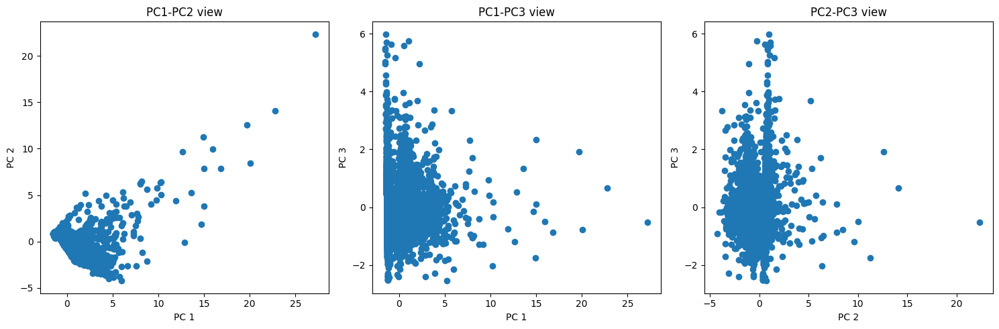

In [35]:
display_pca_views(explore_combs, explore_new, None)

PCA with 3 components explains 82.35% of the variance

In [36]:
explore_var_ex = np.sum(explore_pca.explained_variance_ratio_)
print(f"Variance Explained: {explore_var_ex*100:.2f}%")

Variance Explained: 82.38%


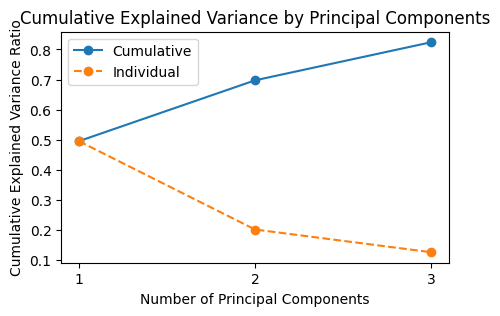

In [37]:
cumulative_variance_ratio = np.cumsum(explore_pca.explained_variance_ratio_)

plt.figure(figsize=(5, 3))
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o', linestyle='-', label='Cumulative')
plt.plot(range(1, len(cumulative_variance_ratio) + 1), explore_pca.explained_variance_ratio_, marker='o', linestyle='--', label='Individual')
plt.title('Cumulative Explained Variance by Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.xticks(range(1, len(cumulative_variance_ratio) + 1))
plt.legend()
plt.show()

#### Density-Based

##### DBSCAN

Using helper function <u>get_kdist</u> from <u>clustering.py</u> to display kdist graph

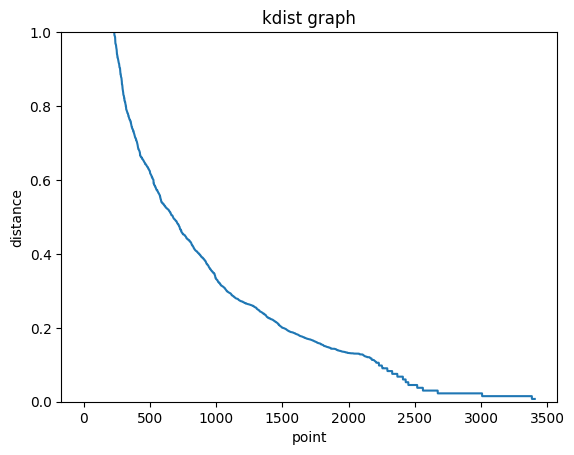

In [38]:
plt.plot(get_kdist(17, explore_new))
plt.title("kdist graph")
plt.xlabel("point")
plt.ylabel("distance")
plt.ylim(0, 1)
plt.show()

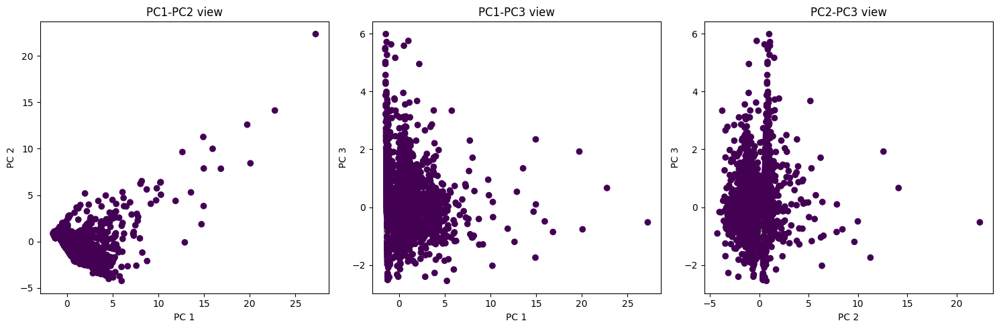

Number of clusters: 8
Number of noise points: 3269
Number of points in the largest cluster: 22
[21 22 16 17 19 16 17  9]
Number of points: 3406


In [39]:
dbscan = DBSCAN(eps=0.01, min_samples=16)
cluster_labels = dbscan.fit_predict(explore_new)

display_pca_views(explore_combs, explore_new, cluster_labels)

print("Number of clusters:", cluster_labels.max() + 1)
print("Number of noise points:", (cluster_labels == -1).sum())
print(
    "Number of points in the largest cluster:",
    np.bincount(cluster_labels[cluster_labels >= 0]).max(),
)
print(np.bincount(cluster_labels[cluster_labels >= 0]))
print("Number of points:", len(cluster_labels))

##### OPTICS

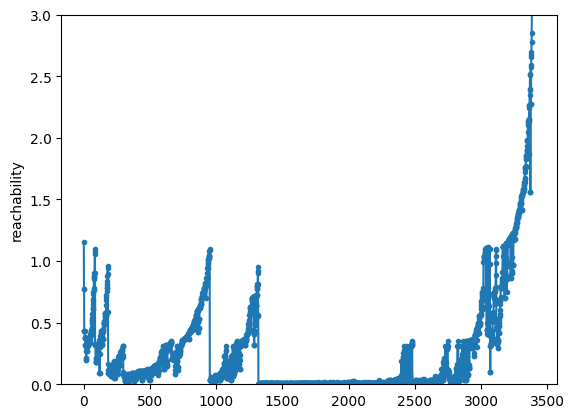

In [40]:
optics = OPTICS(min_samples=4, cluster_method="dbscan")
optics.fit(explore_orig)
plt.plot(optics.reachability_[optics.ordering_], ".-")
plt.ylim(0, 3)
plt.ylabel("reachability")
plt.show()

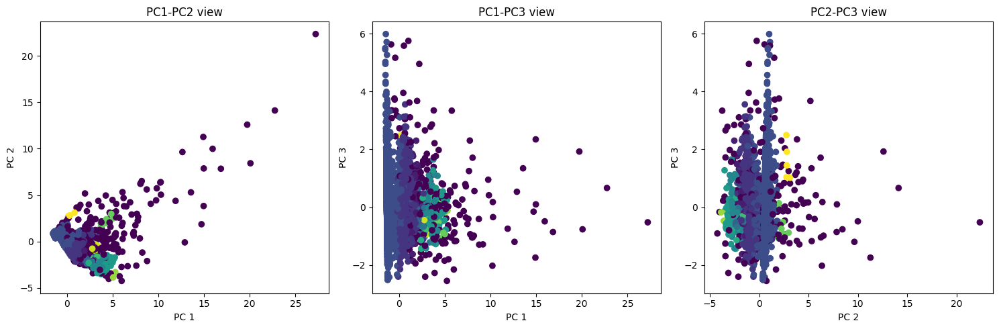

Number of clusters: 13
Number of noise points: 244
Number of points in the largest cluster: 2068
[  82  855 2068   16   14   46   48    7    4   10    3    4    5]
Number of points: 3406
Silhouette score: 0.2830375939873879


In [41]:
cluster_labels = cluster_optics_dbscan(
    reachability=optics.reachability_,
    core_distances=optics.core_distances_,
    ordering=optics.ordering_,
    eps=1,
)

display_pca_views(explore_combs, explore_new, cluster_labels)

print("Number of clusters:", cluster_labels.max() + 1)
print("Number of noise points:", (cluster_labels == -1).sum())
print(
    "Number of points in the largest cluster:",
    np.bincount(cluster_labels[cluster_labels >= 0]).max(),
)
print(np.bincount(cluster_labels[cluster_labels >= 0]))
print("Number of points:", len(cluster_labels))
print("Silhouette score:", silhouette_score(explore_orig, cluster_labels))

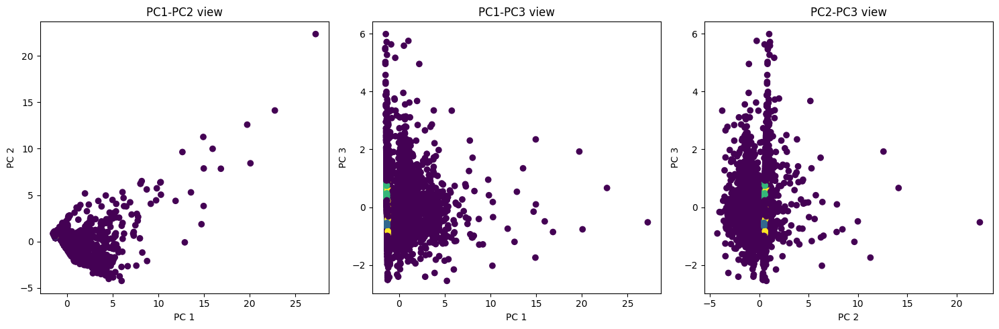

Number of clusters: 3
Number of noise points: 2849
Number of points in the largest cluster: 191
Number of points: 3406
Silhouette score: -0.19308349313437465


In [42]:
optics = OPTICS(
    min_samples=16, cluster_method="xi", xi=0.05, min_cluster_size=0.05
)
cluster_labels = optics.fit_predict(explore_orig)

display_pca_views(explore_combs, explore_new, cluster_labels)

print("Number of clusters:", cluster_labels.max() + 1)
print("Number of noise points:", (cluster_labels == -1).sum())
print(
    "Number of points in the largest cluster:",
    np.bincount(cluster_labels[cluster_labels >= 0]).max(),
)
print("Number of points:", len(cluster_labels))
print("Silhouette score:", silhouette_score(explore_orig, cluster_labels))

#### Representative-Based

##### K-Means

Using helper function <u>kmeans_proper</u> from <u>clustering.py</u> to display exploration of K-means clustering

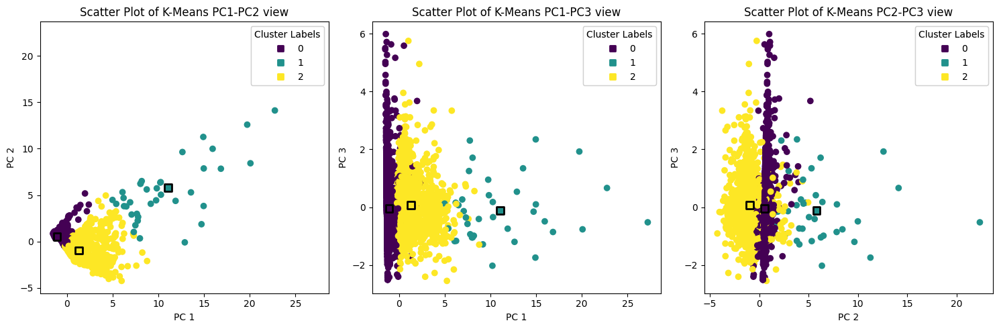

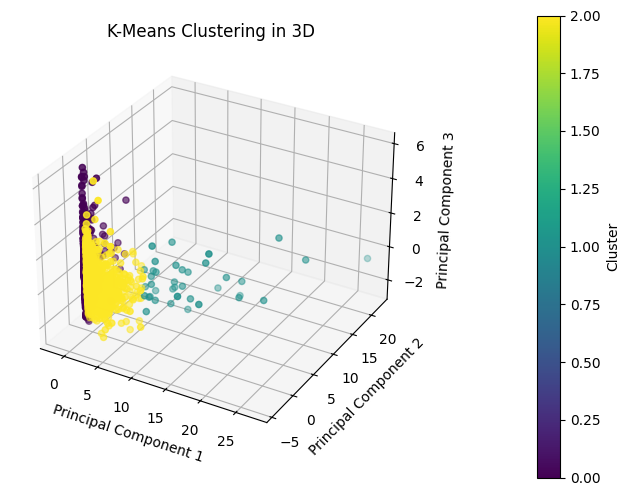

In [43]:
explore_kmeans = kmeans_proper(explore_combs, explore_pca, 3, explore_orig, explore_new)

Using helper functions <u>cluster_range</u>, <u>plot_clusters2</u> and <u>plot_internal</u> from <u>clustering.py</u> to display viz of different number of K and its internal validation criterion

In [44]:
explore_res = cluster_range(
    explore_orig.values, explore_kmeans, 2, 11
)

PC1-PC2


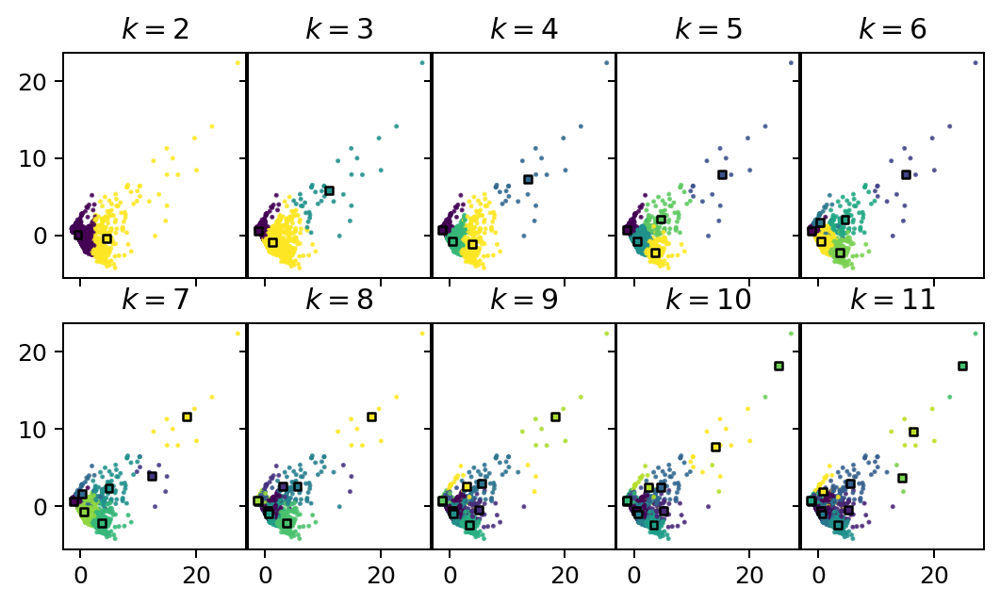

PC1-PC3


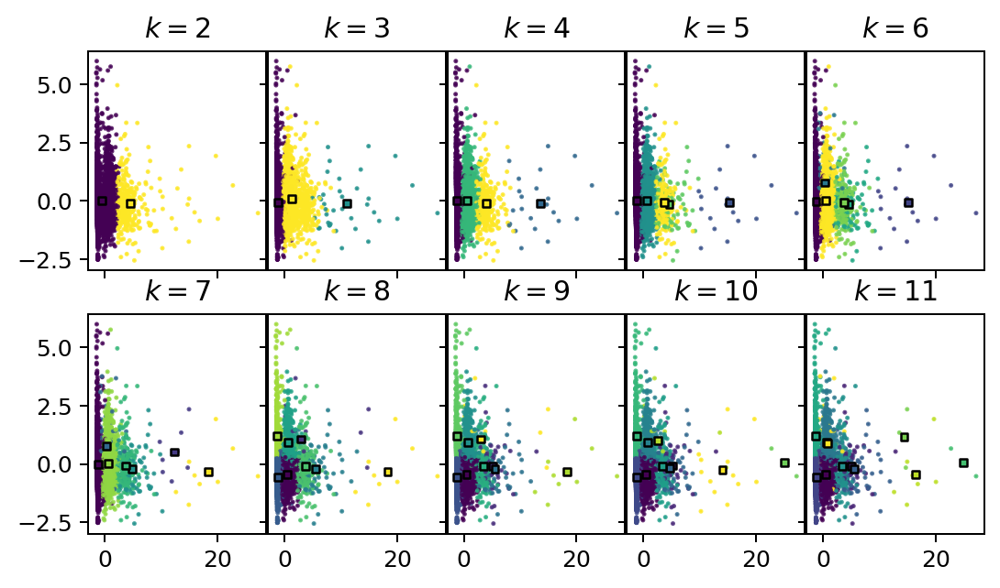

PC2-PC3


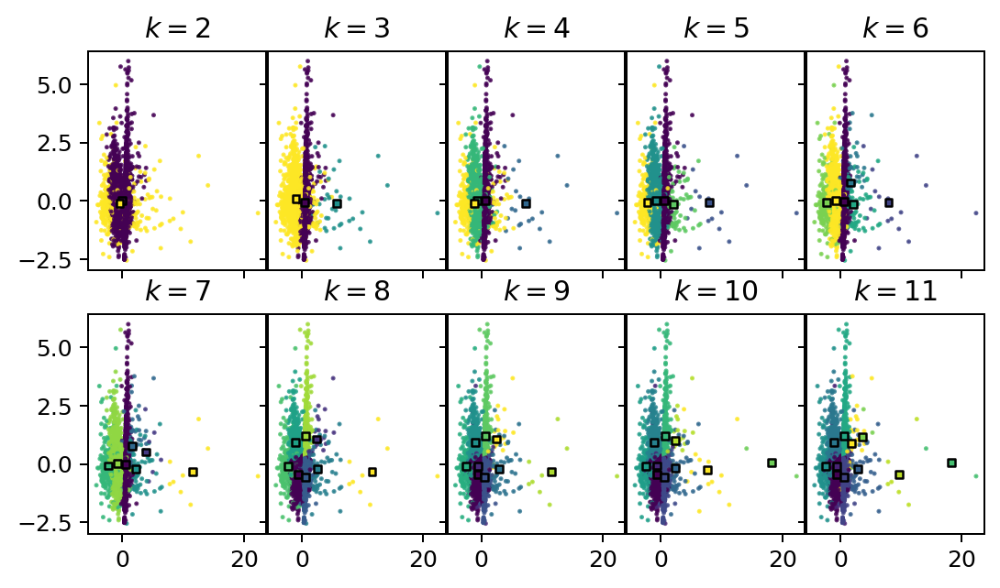

In [45]:
plot_clusters2(
    explore_combs, explore_new, explore_res['ys'], explore_res['centers'],
    explore_pca, ((7, 3.8), (7, 3.8), (7, 3.8)),
    180, True, True, True
)

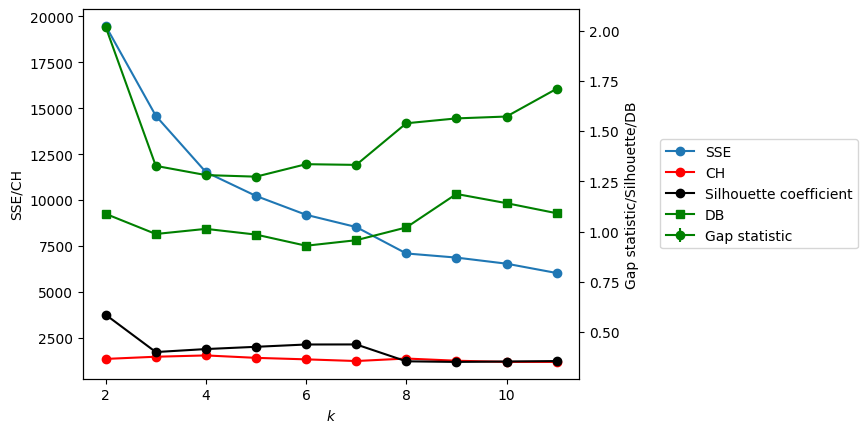

In [46]:
fig, ax = plt.subplots()
plot_internal(
    ax,
    explore_res["inertias"],
    explore_res["chs"],
    explore_res["scs"],
    explore_res["dbs"],
    explore_res["gss"],
    explore_res["gssds"],
)
plt.show()

Best K is blah blah....

##### K-Mediods (Skip)

Skipping K-Medioid exploration, explore dataset too big (Kernel always dies out)

#### Heirarchical-Based

Using helper functions <u>heirarch_cluster</u> from <u>clustering.py</u> to display different Heirarchical-Based Clustering types (Single, Average, Complete, Wards)

single


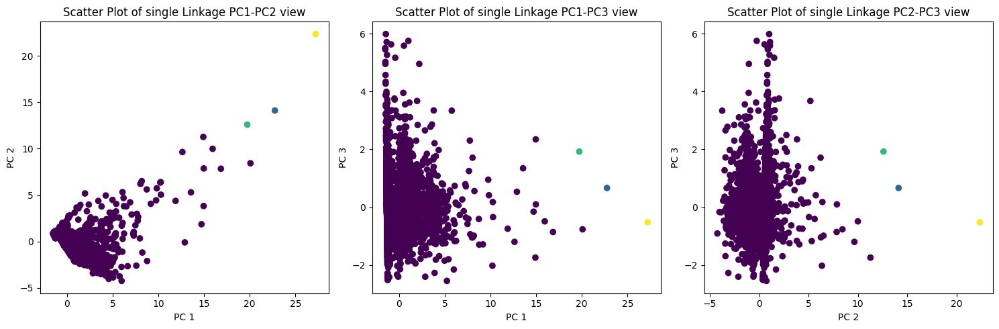

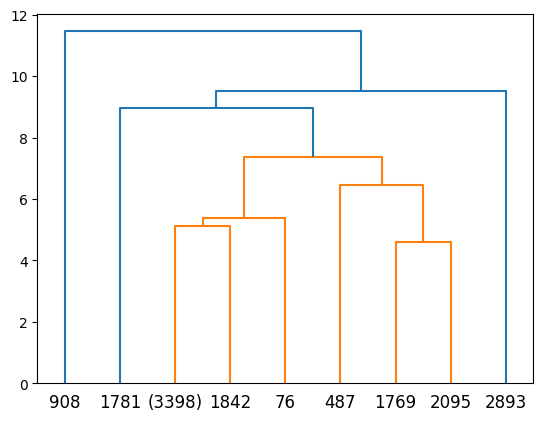

average


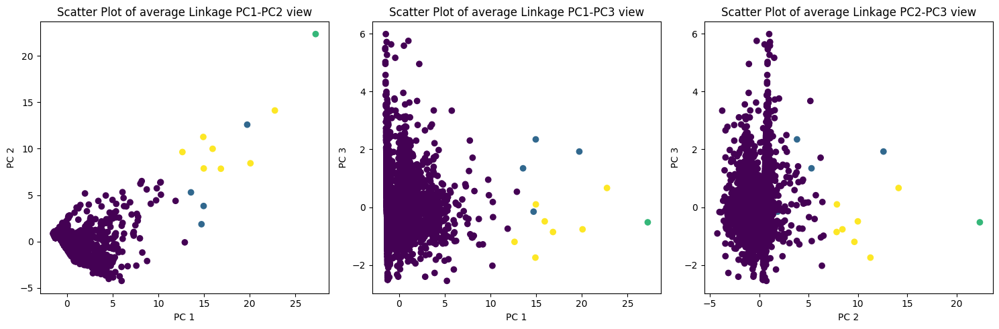

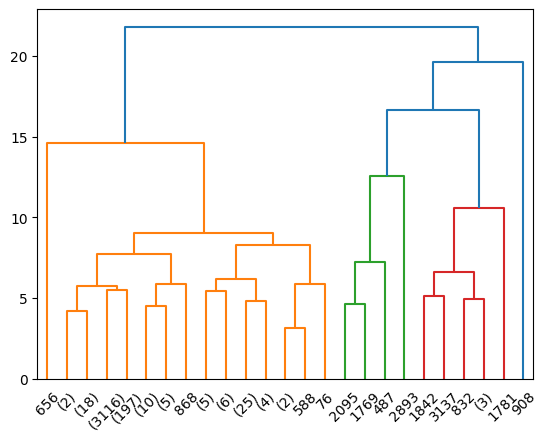

complete


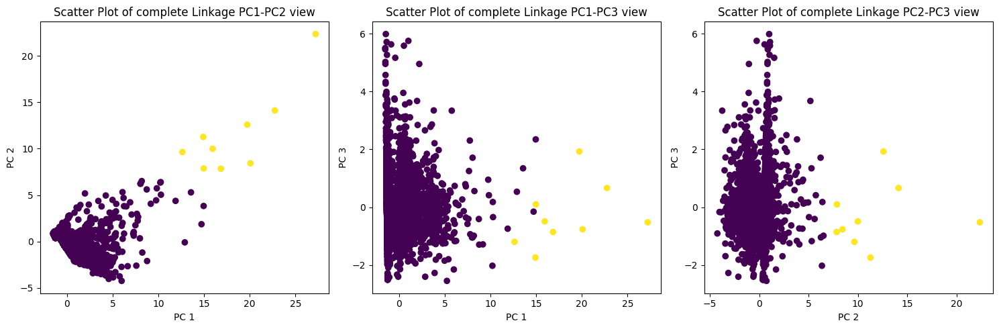

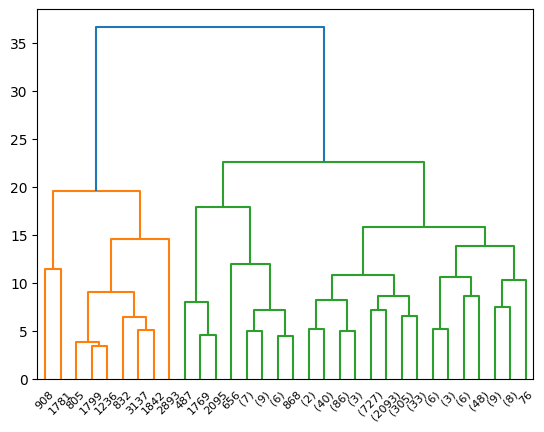

ward


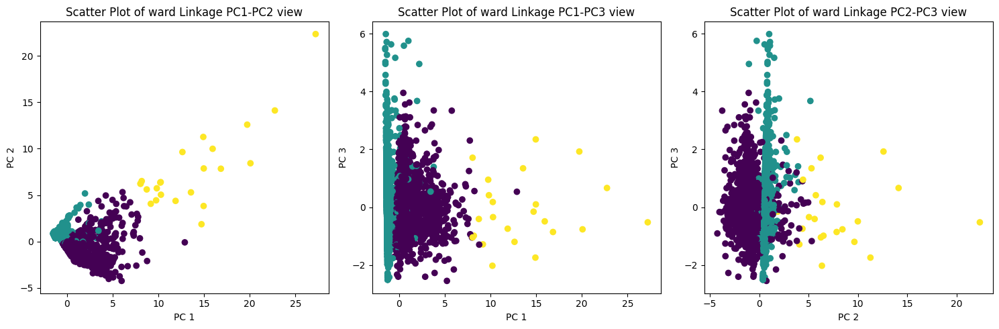

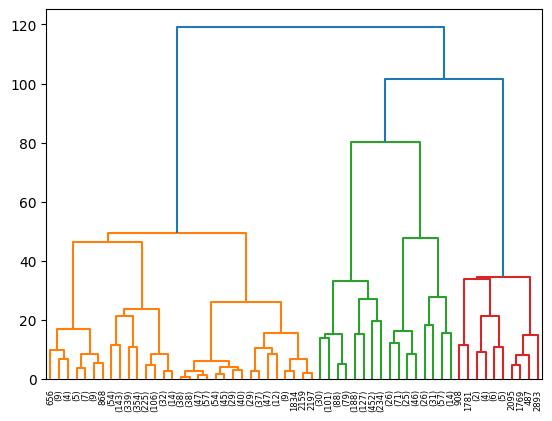

In [47]:
explore_heir_labels = []
# [('single', 11), ('average', 35), ('complete', 45), ('ward', 160)]
# [('single', 11), ('average', 35), ('complete', 45), ('ward', 160)]
# for i in [('single', 5), ('average', 8.1), ('complete', 12.5), ('ward', 75)]:
for i in [('single', 8), ('average', 15.1), ('complete', 25), ('ward', 90)]:
    print(i[0])
    cluster_labels = heirarch_cluster(
        explore_combs, i[0], i[1], explore_orig.values, explore_new,
    )
    explore_heir_labels.append((i[0], cluster_labels))

#### Highlight on Ward's Method on a smaller subset of the LFB Dataset

Highlight on Ward's Method in Heirarchical clustering as it produced a good cluster visually similar to K-Means, although this clustering method can't handle the entire dataset (kernel dies), we'll highlight the cluster labels on the explore subset instead:

In [48]:
explore_wards_cluster_labels = explore_heir_labels[3][1]

In [49]:
explore_compare['wards cluster'] = explore_wards_cluster_labels

In [50]:
boroughs = explore_compare['borough'].unique().tolist()

#### Sidequest - Setup UK geojson for plotting choropleth map (used later too)

In [51]:
with open('GB_local_authority.json', 'r') as f:
    local_auth = json.load(f)

local_auth_list = []
for i in range(len(local_auth["features"])):
    local_a = local_auth["features"][i]['properties']['LAD21NM']
    local_auth_list.append(local_a)
local_auth_list = [i for i in local_auth_list if i.upper() in boroughs]

Using helper functions <u>print_cluster_metrics</u> from <u>clustering.py</u> to display cluster metrics for labelling

cluster 0


,first_pump_time,second_pump_time,num_of_station_pumps,num_pumps,pump_cnt,pump_hrs_rnd_up,notional_cost,num_calls
count,1595.000000,1595.000000,1595.000000,1595.000000,1595.000000,1595.000000,1595.000000,1595.000000
mean,301.894044,402.445768,2.119749,2.521630,2.826332,3.022571,1100.215674,1.836991
std,106.846831,158.819575,1.012509,1.002507,1.457661,3.552544,1293.126038,1.747128
min,1.000000,0.000000,1.000000,1.000000,2.000000,1.000000,364.000000,1.000000
25%,231.000000,304.500000,2.000000,2.000000,2.000000,1.000000,364.000000,1.000000
50%,291.000000,379.000000,2.000000,2.000000,2.000000,2.000000,728.000000,1.000000
75%,359.000000,472.000000,2.000000,3.000000,3.000000,3.000000,1092.000000,2.000000
max,785.000000,1196.000000,7.000000,8.000000,15.000000,27.000000,9828.000000,18.000000


PropertyCategory
Dwelling             997
Non Residential      263
Outdoor              131
Outdoor Structure     95
Other Residential     63
Name: count, dtype: int64

PropertyType
House - single occupancy                              280
Purpose Built Flats/Maisonettes - 4 to 9 storeys      229
Purpose Built Flats/Maisonettes - Up to 3 storeys     188
Converted Flat/Maisonettes - 3 or more storeys         72
Converted Flat/Maisonette - Up to 2 storeys            63
Name: count, dtype: int64

borough
CROYDON          97
SOUTHWARK        87
NEWHAM           71
TOWER HAMLETS    71
WESTMINSTER      70
Name: count, dtype: int64

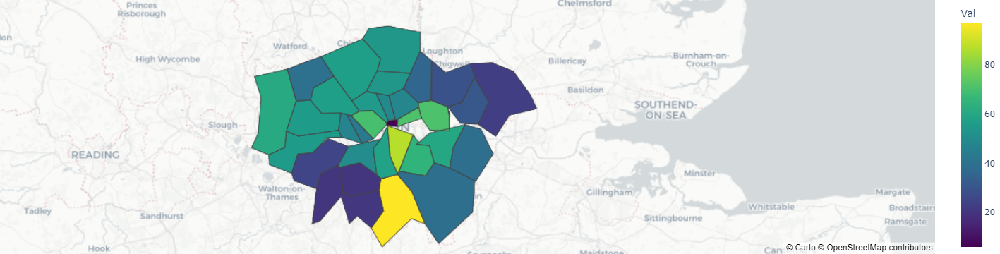

First percent coming from main station 70.91%
Second percent coming from main station 35.07%


cluster 1


,first_pump_time,second_pump_time,num_of_station_pumps,num_pumps,pump_cnt,pump_hrs_rnd_up,notional_cost,num_calls
count,1788.000000,1788.000000,1788.000000,1788.000000,1788.000000,1788.000000,1788.000000,1788.000000
mean,333.236018,3.929530,1.018456,1.039150,1.068233,1.158837,421.816555,1.978747
std,146.306308,43.834283,0.154019,0.210602,0.322341,0.579876,211.074968,2.745622
min,3.000000,0.000000,1.000000,1.000000,1.000000,1.000000,364.000000,1.000000
25%,236.000000,0.000000,1.000000,1.000000,1.000000,1.000000,364.000000,1.000000
50%,310.000000,0.000000,1.000000,1.000000,1.000000,1.000000,364.000000,1.000000
75%,404.250000,0.000000,1.000000,1.000000,1.000000,1.000000,364.000000,2.000000
max,1129.000000,1137.000000,4.000000,4.000000,5.000000,7.000000,2548.000000,42.000000


PropertyCategory
Outdoor Structure    668
Outdoor              533
Road Vehicle         321
Dwelling             180
Non Residential       78
Name: count, dtype: int64

PropertyType
Small refuse/rubbish container                       356
Car                                                  165
Loose refuse                                         141
Large refuse/rubbish container (eg skip/ paladin)     99
Domestic garden (vegetation not equipment)            85
Name: count, dtype: int64

borough
TOWER HAMLETS    112
CROYDON           93
ENFIELD           93
WESTMINSTER       82
HOUNSLOW          82
Name: count, dtype: int64

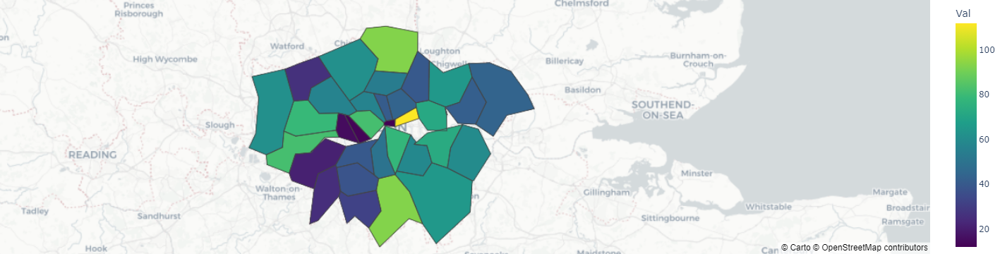

First percent coming from main station 76.12%
Second percent coming from main station 72.73%


cluster 2


,first_pump_time,second_pump_time,num_of_station_pumps,num_pumps,pump_cnt,pump_hrs_rnd_up,notional_cost,num_calls
count,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000
mean,311.478261,367.391304,3.000000,3.869565,15.391304,42.782609,15572.869565,14.869565
std,126.930500,152.080642,1.783765,2.282430,5.246117,19.150021,6970.607795,14.921931
min,83.000000,0.000000,1.000000,2.000000,9.000000,19.000000,6916.000000,1.000000
25%,241.000000,271.500000,2.000000,2.000000,11.000000,31.000000,11284.000000,3.500000
50%,292.000000,350.000000,3.000000,3.000000,14.000000,35.000000,12740.000000,9.000000
75%,363.500000,451.500000,4.000000,4.500000,19.000000,55.000000,20020.000000,18.500000
max,623.000000,706.000000,7.000000,11.000000,29.000000,99.000000,36036.000000,48.000000


PropertyCategory
Dwelling             15
Non Residential       6
Other Residential     2
Name: count, dtype: int64

PropertyType
Purpose Built Flats/Maisonettes - 4 to 9 storeys              4
Purpose Built Flats/Maisonettes - 10 or more storeys          3
Restaurant/cafe                                               3
Converted Flat/Maisonettes - 3 or more storeys                2
Licensed House in Multiple Occupation - 3 or more storeys     1
Name: count, dtype: int64

borough
HILLINGDON     2
WESTMINSTER    2
WANDSWORTH     2
BRENT          2
SOUTHWARK      1
Name: count, dtype: int64

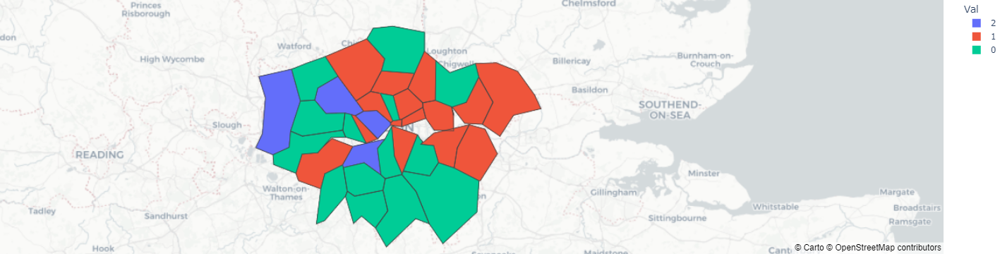

First percent coming from main station 60.87%
Second percent coming from main station 45.45%




In [52]:
for n_cluster in set(explore_wards_cluster_labels):
    print_cluster_metrics(
        n_cluster, explore_compare, local_auth_list,
        local_auth, 'wards cluster'
    )

#### Determining the best clustering methods to proceed

Proceeding to K-Means clustering proper as it has the best clustering visually and can handle the entire dataset.

### K-Means Proper

#### Dimensionality Reduction

In [53]:
final_pca = PCA(n_components=3, random_state=1337)
final_new = final_pca.fit_transform(final_df[0].values)
final_orig, final_compare = final_df

In [54]:
final_combs = list(combinations([i+1 for i in range(3)], 2))
print(f"Combinations {final_combs}")

Combinations [(1, 2), (1, 3), (2, 3)]


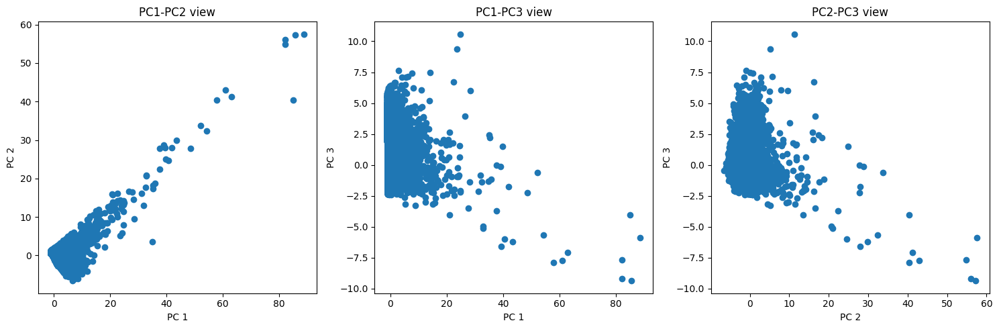

In [55]:
display_pca_views(final_combs, final_new, None)

PCA with 3 components explains 82.82% of the variance

In [56]:
final_var_ex = np.sum(final_pca.explained_variance_ratio_)
print(f"Variance Explained: {final_var_ex*100:.2f}%")

Variance Explained: 82.94%


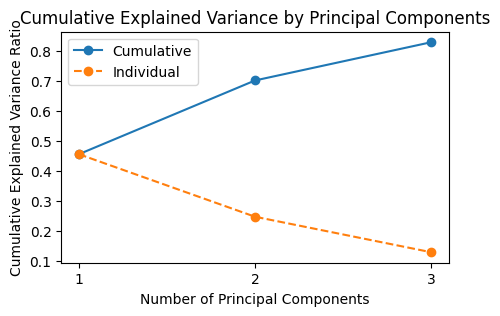

In [57]:
cumulative_variance_ratio = np.cumsum(final_pca.explained_variance_ratio_)

plt.figure(figsize=(5, 3))
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o', linestyle='-', label='Cumulative')
plt.plot(range(1, len(cumulative_variance_ratio) + 1), final_pca.explained_variance_ratio_, marker='o', linestyle='--', label='Individual')
plt.title('Cumulative Explained Variance by Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.xticks(range(1, len(cumulative_variance_ratio) + 1))
plt.legend()
plt.show()

#### Clustering proper

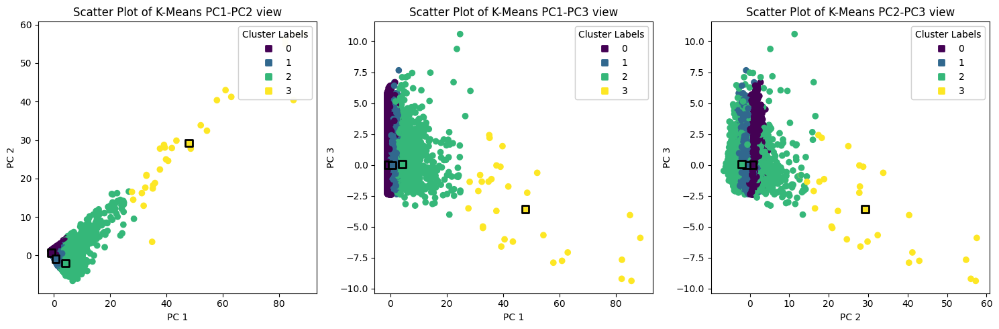

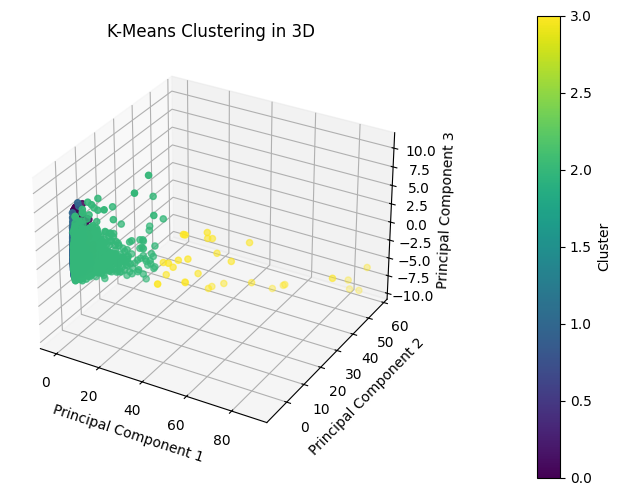

In [58]:
final_kmeans = kmeans_proper(
    final_combs, final_pca, 4, final_orig, final_new,
)

In [ ]:
final_res = cluster_range(
    final_orig.values, final_kmeans, 2, 11
)

In [ ]:
plot_clusters2(
    final_combs, final_new, final_res['ys'], final_res['centers'],
    final_pca, ((7, 3.8), (7, 3.8), (7, 3.8)),
    180, True, True, True
)

In [ ]:
fig, ax = plt.subplots()
plot_internal(
    ax,
    final_res["inertias"],
    final_res["chs"],
    final_res["scs"],
    final_res["dbs"],
    final_res["gss"],
    final_res["gssds"],
)
plt.show()

Best K is blah blah

#### Labeling Clusters

In [ ]:
final_compare['kmeans cluster'] = final_kmeans.labels_

In [ ]:
final_compare.to_csv('cluster_labels.csv')

In [ ]:
for n_cluster in set(final_kmeans.labels_):
    print_cluster_metrics(
        n_cluster, final_compare, local_auth_list,
        local_auth, 'kmeans cluster'
    )

## Results and Discussion

yadda

## Conclusions

yadda yadda yadda

## Recommendations

yadda yadda yadda

## References